In [1]:
using DataFrames
using Gadfly
using Compose
set_default_plot_size(30cm, 12cm)

# LF

### production

In [3]:
# Energies
dir_lf_pdt = "/home/german/labo/17/pdz/run/lf"
lf_pdt_Ek = readdlm("$dir_lf_pdt/data/outputs/ektot.dat");
lf_pdt_Ep = readdlm("$dir_lf_pdt/data/outputs/eptot.dat");
lf_pdt_Etot = readdlm("$dir_lf_pdt/data/outputs/etot.dat");
df_lf_PDT_E = DataFrame(E=[lf_pdt_Ek[:, 2]; lf_pdt_Ep[:, 2]; lf_pdt_Etot[:, 2]],
NSTEP=[lf_pdt_Ek[:, 1]; lf_pdt_Ep[:, 1]; lf_pdt_Etot[:, 1]];
Type=repeat(["Ek"; "Ep"; "Etot"], inner=[length(lf_pdt_Ek[:, 1])]));

# Temperature
lf_pdt_T = readdlm("$dir_lf_pdt/data/outputs/temp.dat");
df_lf_PDT_T = DataFrame(Temperature=lf_pdt_T[:, 2],
NSTEP=lf_pdt_T[:, 1]);

# RMSD 
lf_pdt_rmsd = readdlm("$dir_lf_pdt/data/rmsd_lf");
df_lf_PDT_RMSD = DataFrame(RMSD=lf_pdt_rmsd[:, 2], Frame=lf_pdt_rmsd[:, 1]);

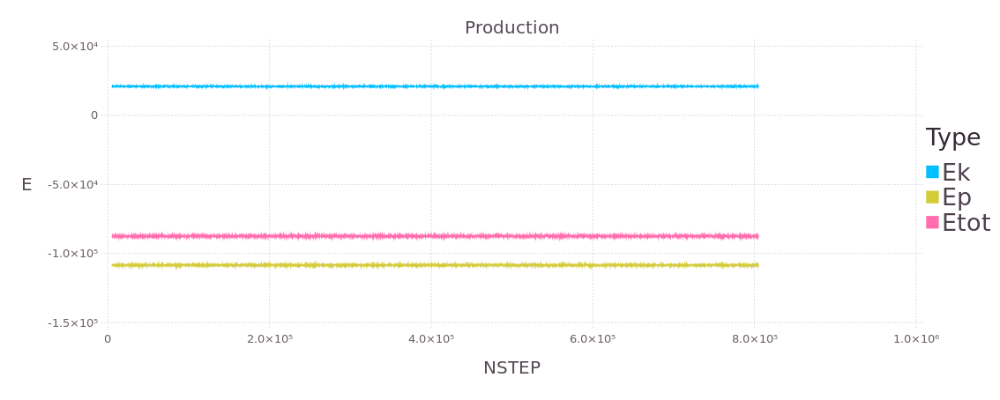

In [4]:
plot(df_lf_PDT_E, Geom.line, x="NSTEP", y="E", color="Type",
Guide.title("Production"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))                                                        

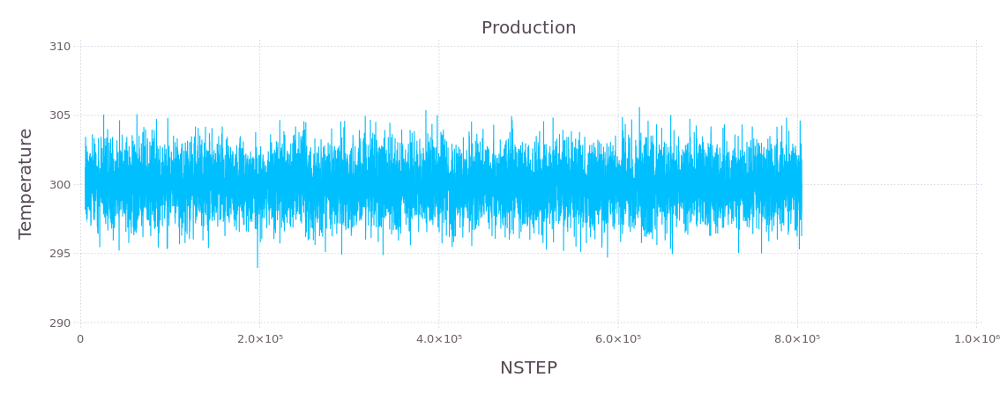

In [5]:
plot(df_lf_PDT_T, Geom.line, x="NSTEP", y="Temperature",
Guide.title("Production"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

### RMSD without loops (resids 12-112)

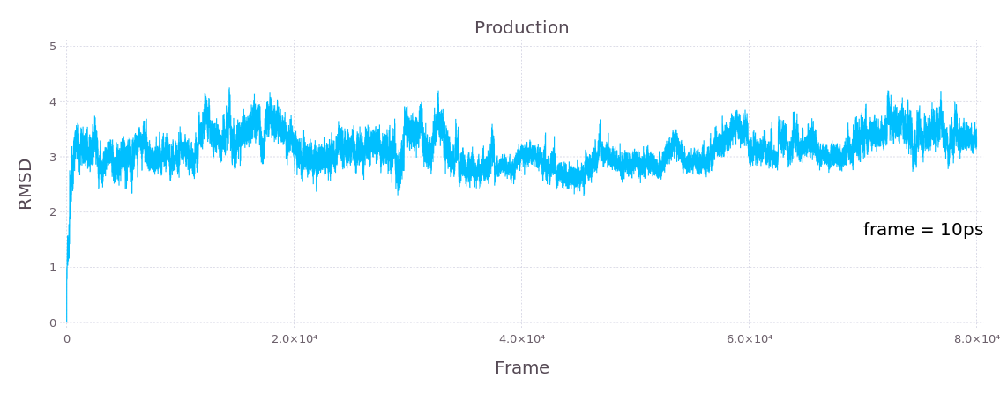

In [13]:
pdf_lf_PDT_RMSD = plot(df_lf_PDT_RMSD, Geom.line, x="Frame", y="RMSD",
Guide.title("Production"),
Guide.annotation(compose(compose(context(), text(70000, 1.5, "frame = 10ps")), fontsize(15pt), fill("black"))),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

# LB

### production

In [7]:
# Energies
dir_lb_pdt = "/home/german/labo/17/pdz/run/lb"
lb_pdt_Ek = readdlm("$dir_lb_pdt/data/outputs/ektot.dat");
lb_pdt_Ep = readdlm("$dir_lb_pdt/data/outputs/eptot.dat");
lb_pdt_Etot = readdlm("$dir_lb_pdt/data/outputs/etot.dat");
df_lb_PDT_E = DataFrame(E=[lb_pdt_Ek[:, 2]; lb_pdt_Ep[:, 2]; lb_pdt_Etot[:, 2]],
NSTEP=[lb_pdt_Ek[:, 1]; lb_pdt_Ep[:, 1]; lb_pdt_Etot[:, 1]];
Type=repeat(["Ek"; "Ep"; "Etot"], inner=[length(lb_pdt_Ek[:, 1])]));

# Temperature
lb_pdt_T = readdlm("$dir_lb_pdt/data/outputs/temp.dat");
df_lb_PDT_T = DataFrame(Temperature=lb_pdt_T[:, 2],
NSTEP=lb_pdt_T[:, 1]);

# RMSD
lb_pdt_rmsd = readdlm("$dir_lb_pdt/data/rmsd_lb");
df_lb_PDT_RMSD = DataFrame(RMSD=lb_pdt_rmsd[:, 2], Frame=lb_pdt_rmsd[:, 1]);

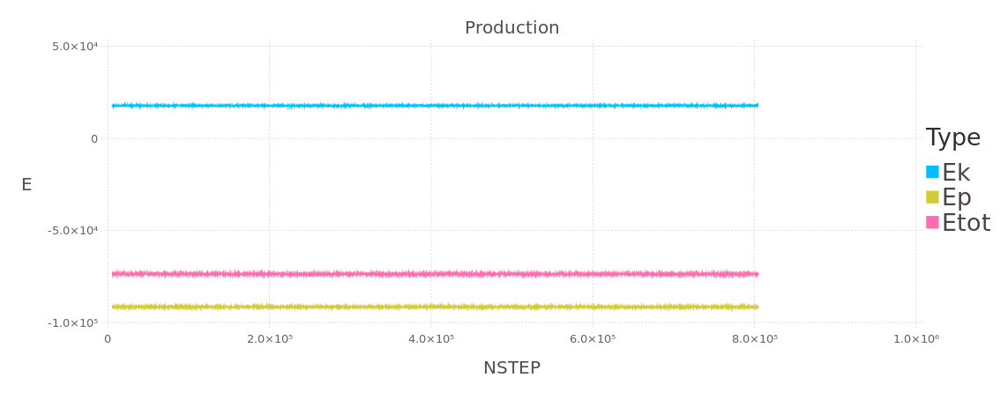

In [8]:
plot(df_lb_PDT_E, Geom.line, x="NSTEP", y="E", color="Type",
Guide.title("Production"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))                                                        

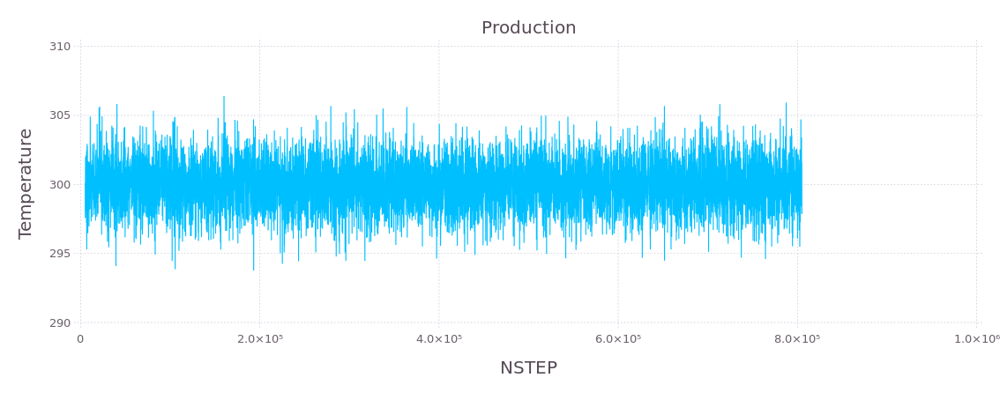

In [9]:
plot(df_lb_PDT_T, Geom.line, x="NSTEP", y="Temperature",
Guide.title("Production"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

### RMSD without loops (resids 12-112)

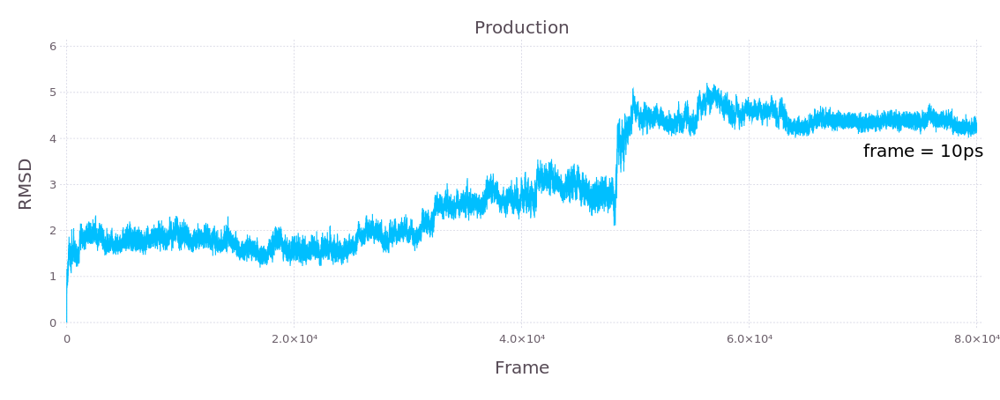

In [10]:
pdf_lb_PDT_RMSD = plot(df_lb_PDT_RMSD, Geom.line, x="Frame", y="RMSD",
Guide.title("Production"),
Guide.annotation(compose(compose(context(), text(70000, 3.5, "frame = 10ps")), fontsize(15pt), fill("black"))),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

## Check distances between constrained atoms

In [24]:
# Read the distances
tmp = readdlm("$dir_lb_pdt/data/distance")[:, 2:end]

# Compile into data frames
df_2076_47 = DataFrame(Frame = df_lb_PDT_RMSD[:, 2],  Distance = tmp[:, 1])
df_2076_460 = DataFrame(Frame = df_lb_PDT_RMSD[:, 2],  Distance = tmp[:, 2])
df_2016_543 = DataFrame(Frame = df_lb_PDT_RMSD[:, 2],  Distance = tmp[:, 3]);

## Distance between VAL132@OXT - GLY30@H // 2076 - 479

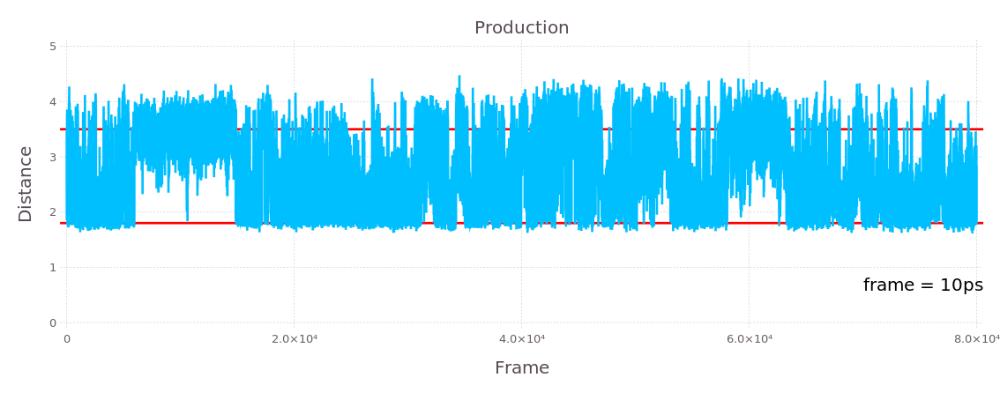

In [39]:
# Plot 
pdf_2076_47 = plot(df_2076_47, Geom.line, x="Frame", y="Distance",
yintercept = [ 1.8 ; 3.5 ], Geom.hline(color = "red"), 
Guide.title("Production"), 
Guide.annotation(compose(compose(context(), text(70000, 0.5, "frame = 10ps")), fontsize(15pt), fill("black"))),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt, line_width = 2pt,
key_title_font_size=20pt, key_label_font_size=20pt))

## Distance between VAL132@OXT - LEU29@H // 2016 - 460

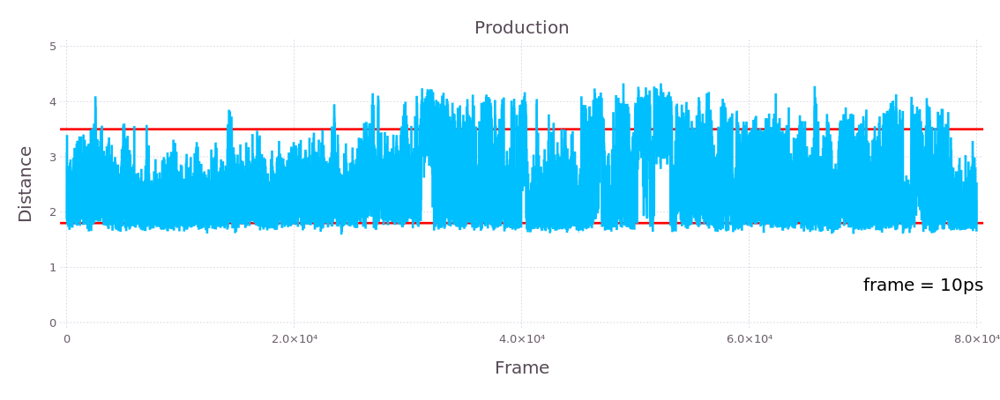

In [38]:
# Plot 
pdf_2076_460 = plot(df_2076_460, Geom.line, x="Frame", y="Distance",
yintercept = [ 1.8 ; 3.5 ], Geom.hline(color = "red"), 
Guide.title("Production"),
Guide.annotation(compose(compose(context(), text(70000, 0.5, "frame = 10ps")), fontsize(15pt), fill("black"))),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt, line_width = 2pt, 
key_title_font_size=20pt, key_label_font_size=20pt))

## Distance between LEU128@O - GLY35@H // 2016 - 543

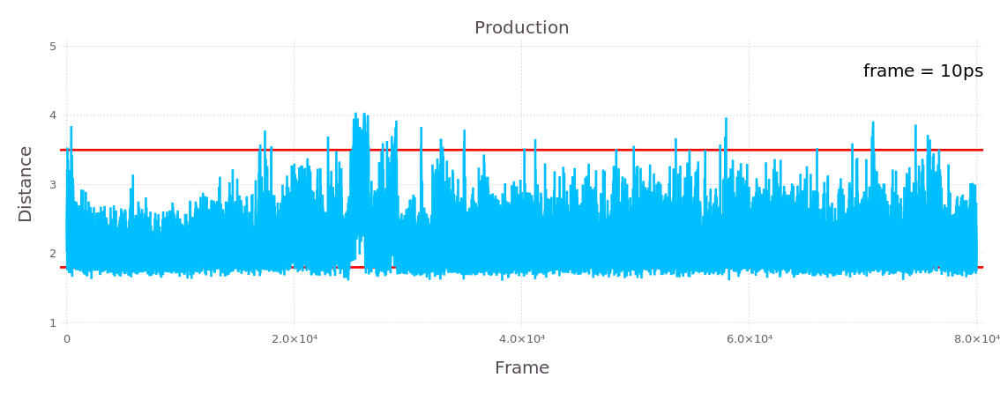

In [40]:
# Plot 
pdf_2016_543 = plot(df_2016_543, Geom.line, x="Frame", y="Distance",
yintercept = [ 1.8 ; 3.5 ], Geom.hline(color = "red"), 
Guide.title("Production"),
Guide.annotation(compose(compose(context(), text(70000, 4.5, "frame = 10ps")), fontsize(15pt), fill("black"))),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt, line_width = 2pt,
key_title_font_size=20pt, key_label_font_size=20pt))